<a href="https://colab.research.google.com/github/sunildjoshi/DeepLearning/blob/master/Yolo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Recognizing Multiple Images with Darknet

One of the most advanced means of multiple object detection YOLO. YOLO is an acronym for You Only Look Once.  The fact that YOLO must only look once speaks to the efficiency of the algorithm. 

### How Does DarkNet/YOLO Work?

YOLO begins by resizing the image to a $S \times S$ grid.  YOLO runs a  single convolutional neural network against this grid that predicts bounding boxes and what might be contained by those boxes. Each bounding box also has a confidence in which item it believes the box contains.  YOLO is a regular convolution network (ImageNet). The only difference is that a YOLO CNN outputs multiple prediction bounding boxes.

**Figure 6.YOLO-DET: The YOLO Detection System**
![The YOLO Detection System](https://raw.githubusercontent.com/jeffheaton/t81_558_deep_learning/master/images/yolo-1.png "The YOLO Detection System")

The output of the YOLO convolutional neural networks is essentially a multiple regression.  YOLO generated the following values for each of the bounding rectangles.

* **x** - The x-coordinate of the center of a bounding rectangle.
* **y** - The y-coordinate of the center of a bounding rectangle.
* **w** - The width of each bounding rectangle.
* **h** - The height of each bounding rectangle.
* **labels** - The relative probabilities of each of the labels (1 value for each label)
* **confidence** - The confidence in this rectangle.

The output layer of a Keras neural network is a Tensor.  In the case of YOLO, this output tensor is 3D and is of the following dimensions.

$ S \times S \times (B \cdot 5 + C) $

The constants in the above expression are:

* *S* - The dimensions that YOLO overlays across the source image.
* *B* - The number of potential bounding rectangles generated for each grid cell.
* *C* - The number of class labels that here are.

The value 5 in the above expression is simply the count of non-label components of each bounding rectangle ($x$, $y$, $h$, $w$, $confidence$.

Because there are $S^2 \cdot B$ total potential bounding rectangles, the image is nearly full.  Because of this, it is essential to drop all rectangles below some threshold of confidence.  

There is only one convolutional neural network, and it "only looks once," 

**Figure 1.YOLO-STRUCT: YOLO Structure**
![YOLO Structure](https://raw.githubusercontent.com/jeffheaton/t81_558_deep_learning/master/images/yolo-3.png "YOLO Structure")


### Using YOLO in Python

To make use of YOLO in Python, you have several options:

* **[yolov3-tf2](https://github.com/zzh8829/yolov3-tf2)** - An unofficial Python package that implements YOLO in Python, using TensorFlow 2.0.

### Installing YoloV3-TF2

YoloV3-TF2 is not available directly through either PIP or CONDA.  Additionally, YoloV3-TF2 is not installed in Google CoLab by default. 

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
import sys

!{sys.executable} -m pip install git+https://github.com/zzh8829/yolov3-tf2.git@master

For YoloV3-TF2 there are several files you must obtain:

* **yolov3.weights** - These are the pre-trained weights provided by the author of YOLO.
* **convert.py** - This is a Python script that converts **yolov3.weights** into a TensorFlow compatible weight format.
* **coco.names** - The names of the 80 items that the **yolov3.weights** neural network was trained to recognize.
* **yolov3.tf** - The YOLO weights converted to a format that TensorFlow can use directly.

Developers have also adapted YOLO for mobile devices by creating the YOLO Tiny pre-trained weights that use a much smaller convolutional neural network and still achieve acceptable levels of quality. 

In [ ]:
import tensorflow as tf
import os
ROOT = '/content/drive/My Drive/DeepLearning'

filename_darknet_weights = tf.keras.utils.get_file(
    os.path.join(ROOT,'yolov3.weights'),
    origin='https://pjreddie.com/media/files/yolov3.weights')
TINY = False

filename_convert_script = tf.keras.utils.get_file(
    os.path.join(os.getcwd(),'convert.py'),
    origin='https://raw.githubusercontent.com/'\
    'zzh8829/yolov3-tf2/master/convert.py')

filename_classes = tf.keras.utils.get_file(
    os.path.join(ROOT,'coco.names'),
    origin='https://raw.githubusercontent.com/zzh8829/'\
    'yolov3-tf2/master/data/coco.names')
filename_converted_weights = os.path.join(ROOT,'yolov3.tf')

In [ ]:
import sys
!{sys.executable} "{filename_convert_script}" --weights "{filename_darknet_weights}" --output "{filename_converted_weights}"

The conversion script is no longer needed once this script converts the YOLO weights have to a TensorFlow format.

In [5]:
import os
os.remove(filename_convert_script)

Now that we have all of the files needed for YOLO, we are ready to use it to recognize components of an image.

### Running DarkFlow (YOLO)

The YoloV3-TF2 library can easily integrate with Python applications. First, it is essential to import all of the needed packages for the library.  Next, the Python program must define all of the YOLO configurations through the Keras flags architecture. 

In [6]:
import time
from absl import app, flags, logging
from absl.flags import FLAGS
import cv2
import numpy as np
import tensorflow as tf
from yolov3_tf2.models import (YoloV3, YoloV3Tiny)
from yolov3_tf2.dataset import transform_images, load_tfrecord_dataset
from yolov3_tf2.utils import draw_outputs
import sys
from PIL import Image, ImageFile
import requests

# Flags are used to define several options for YOLO.
flags.DEFINE_string('classes', filename_classes, 'path to classes file')
flags.DEFINE_string('weights', filename_converted_weights, 'path to weights file')
flags.DEFINE_boolean('tiny', False, 'yolov3 or yolov3-tiny')
flags.DEFINE_integer('size', 416, 'resize images to')
flags.DEFINE_string('tfrecord', None, 'tfrecord instead of image')
flags.DEFINE_integer('num_classes', 80, 'number of classes in the model')
FLAGS([sys.argv[0]])

# Locate devices to run YOLO on (e.g. GPU)
physical_devices = tf.config.experimental.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)

It is important to understand that Keras flags can only be defined once. 

The weights are loaded, and the object is ready for use as the **yolo** variable.  It is not necessary to reload the weights and obtain a new **yolo** variable for each classification.  

In [7]:
# This example does not use the "Tiny version"
if FLAGS.tiny:
    yolo = YoloV3Tiny(classes=FLAGS.num_classes)
else:
    yolo = YoloV3(classes=FLAGS.num_classes)

# Load weights and classes
yolo.load_weights(FLAGS.weights).expect_partial()
print('weights loaded')

class_names = [c.strip() for c in open(FLAGS.classes).readlines()]
print('classes loaded')

weights loaded
classes loaded


YoloV3-TF2 expects that the image is in the format of a Numpy array.  An image file, such as JPEG or PNG, is converted into this raw Numpy format by calling the TensorFlow **decode_image** function. 

In [8]:
# Read image to classify
url = "https://upload.wikimedia.org/wikipedia/commons/b/b9/Football_iu_1996.jpg"
response = requests.get(url)
img_raw = tf.image.decode_image(response.content, channels=3)

Preprocessing the image so that it is the size expected by YoloV3-TF2. Any sub-image recognized with confidence below this value is not returned by YOLO.

In [9]:
# Preprocess image
img = tf.expand_dims(img_raw, 0)
img = transform_images(img, FLAGS.size)

# Desired threshold (any sub-image below this confidence 
# level will be ignored.)
FLAGS.yolo_score_threshold = 0.5

# Recognize and report results
t1 = time.time()
boxes, scores, classes, nums = yolo(img)
t2 = time.time()
print(f"Prediction time: {(t2 - t1)}")

Prediction time: 1.6426291465759277


**Yolo** returns three arrays named **boxes**, **scores**, and **classes** that are of the same length. **yolo** function returns an array named called **nums**. The first element of the **nums** array specifies how many sub-images YOLO found to be above the score threshold.

* **boxes** - The bounding boxes for each of the sub-images detected.
* **scores** - The confidence for each of the sub-images detected.
* **classes** - The string class names for each of the items.
* **nums** - The number of images above the threshold.

In [10]:
print('detections:')
for i in range(nums[0]):
    cls = class_names[int(classes[0][i])]
    score = np.array(scores[0][i])
    box = np.array(boxes[0][i])
    print(f"\t{cls}, {score}, {box}")

detections:
	person, 0.9991870522499084, [0.68374574 0.18972272 0.8648007  0.6239151 ]
	person, 0.9983149170875549, [0.05983302 0.15756753 0.25877658 0.8833358 ]
	person, 0.9968764781951904, [0.33596742 0.23744243 0.7598989  0.8856289 ]
	sports ball, 0.9727458357810974, [0.77120376 0.76379734 0.8285564  0.8569276 ]
	person, 0.9339144825935364, [3.6942586e-04 1.8885216e-01 1.1706054e-01 8.5976970e-01]


YoloV3-TF2 includes a function named **draw_outputs** that allows the sub-image detections to be visualized.

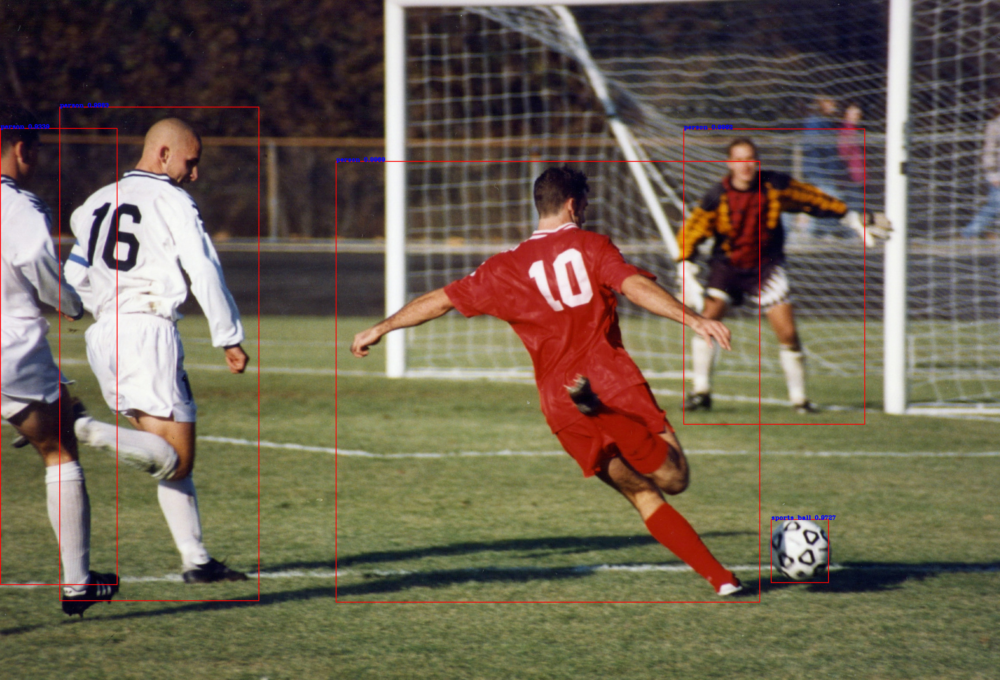

In [11]:
# Display image using YOLO library's built in function
img = img_raw.numpy()
img = draw_outputs(img, (boxes, scores, classes, nums), class_names)
#cv2.imwrite(FLAGS.output, img) # Save the image
display(Image.fromarray(img, 'RGB')) # Display the image